In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/ukbench100/ukbench00932.jpg
/kaggle/input/ukbench100/ukbench00880.jpg
/kaggle/input/ukbench100/ukbench00831.jpg
/kaggle/input/ukbench100/ukbench00186.jpg
/kaggle/input/ukbench100/ukbench00679.jpg
/kaggle/input/ukbench100/ukbench00948.jpg
/kaggle/input/ukbench100/ukbench00897.jpg
/kaggle/input/ukbench100/ukbench00171.jpg
/kaggle/input/ukbench100/ukbench00731.jpg
/kaggle/input/ukbench100/ukbench00195.jpg
/kaggle/input/ukbench100/ukbench00864.jpg
/kaggle/input/ukbench100/ukbench00835.jpg
/kaggle/input/ukbench100/ukbench00538.jpg
/kaggle/input/ukbench100/ukbench00494.jpg
/kaggle/input/ukbench100/ukbench00421.jpg
/kaggle/input/ukbench100/ukbench00961.jpg
/kaggle/input/ukbench100/ukbench00084.jpg
/kaggle/input/ukbench100/ukbench00251.jpg
/kaggle/input/ukbench100/ukbench00724.jpg
/kaggle/input/ukbench100/ukbench00873.jpg
/kaggle/input/ukbench100/ukbench00085.jpg
/kaggle/input/ukbench100/ukbench00958.jpg
/kaggle/input/ukbench100/ukbench00118.jpg
/kaggle/input/ukbench100/ukbench00

# Brief
We want to explore and compare a few techniques fo assessing image similarity, focusing on 2 distinct levels:
1. **Duplicate or Near-Duplicate Image Detection**:</br>
   This involves identifying images that are nearl identical, with minimal alterations (slight variation in camera angle, lighting conditions, minor cropping. resizing or compression, burst capture of the same scene)</br>
   Detecting these near-duplicates is crucial in applications like photo deduplication, digital asset management, and copyright enforcement.
2. **Semantic Similarity Detection**:</br>
   This level focuses on recognizing images that, while not identical, share similar content or depict the same objects/scenes from different perspectives<br>
   Semantic similarity detection is vital for tasks such as content-based image retrieval, scene understanding etc.
   

# 1. Near-Duplicate Image Detection Techniques

We will try three widely used techniques for this purpose:​

1. **Perceptual Hashing (pHash)**</br>
Purpose: Effective for detecting duplicates where images have undergone slight modifications like resizing, compression, or slight color adjustments.</br>
How It Works: pHash computes a hash value based on the image's perceptual characteristics, capturing its essence. It typically involves:
    * Converting the image to grayscale.
    * Applying a Discrete Cosine Transform (DCT) to extract frequency components.
    * Generating a hash from the low-frequency DCT coefficients, which represent the most significant visual information.

Comparison Metric: Hamming distance between hashes; a smaller distance indicates higher similarity.</br></br>

2. **Average Hashing (aHash)**</br>
Purpose: Simplifies image comparison by reducing images to their average luminance values. Quick and efficient for detecting exact or near-exact duplicates but less robust to significant alterations</br>
How It Works: aHash processes images by:
    * Resizing the image to a smaller, fixed size (e.g., 8x8 pixels).
    * Converting to grayscale.
    * Calculating the average pixel value.
    * Setting each bit in the hash: 1 if the pixel's value is above the average, 0 otherwise.

Comparison Metric: Hamming distance between hashes.</br></br>

3. **Color Histogram Comparison**</br>
Purpose: Analyzes the distribution of colors within an image to identify similarities. Useful for identifying images with similar color compositions; however, it may not be effective if images have similar colors but different content</br>
How It Works: This method involves:
    * Computing histograms for each color channel (e.g., RGB) that represent the frequency of pixel intensities.
    * Comparing these histograms between images using statistical measures.

Comparison Metrics: Commonly used metrics include:

    * Correlation: Measures the linear relationship between histograms.
    * Chi-Square: Assesses the divergence between observed and expected frequencies.
    * Intersection: Calculates the overlapping area between histograms.
    * Bhattacharyya Distance: Evaluates the similarity between two probability distributions.</br>

In [2]:
!pip install ipython-autotime 
%load_ext autotime

time: 486 µs (started: 2025-05-20 10:48:02 +00:00)


In [3]:
!pip install imagehash
!pip install opencv-python

time: 6.01 s (started: 2025-05-20 10:48:02 +00:00)


## Let's get the data first

In [4]:
import os
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

time: 611 µs (started: 2025-05-20 10:48:27 +00:00)


In [5]:
#helper function to visualise images
import matplotlib.pyplot as plt
import math

def show_images_in_grid(images, titles=None, cols=3, figsize=(15, 8)):
    """
    Display a list of images in a grid with optional titles.

    Args:
        images (list): List of images (as NumPy arrays or loaded using PIL/mpimg).
        titles (list): Optional list of titles for each image.
        cols (int): Number of columns in the grid.
        figsize (tuple): Size of the entire figure.
    """
    n_images = len(images)
    rows = math.ceil(n_images / cols)

    fig, axs = plt.subplots(rows, cols, figsize=figsize)
    axs = axs.flatten()  # flatten in case of 2D array

    for i in range(len(axs)):
        if i < n_images:
            axs[i].imshow(images[i])
            axs[i].axis('off')
            if titles:
                axs[i].set_title(titles[i])
        else:
            axs[i].axis('off')  # Hide empty subplots

    plt.tight_layout()
    plt.show()


time: 1.13 ms (started: 2025-05-20 10:48:27 +00:00)


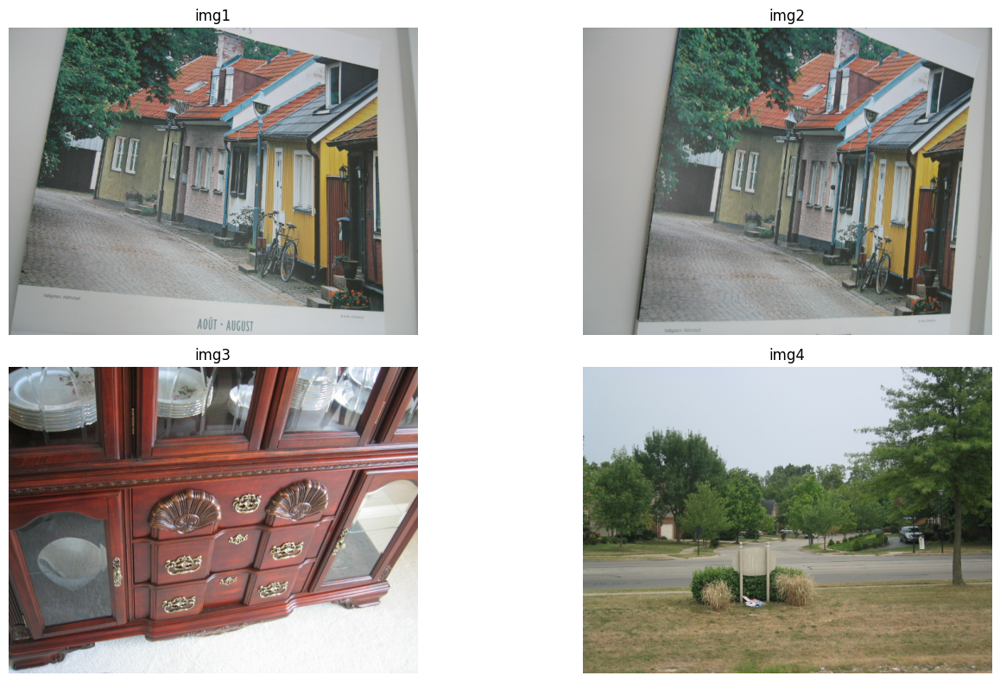

time: 694 ms (started: 2025-05-20 10:48:30 +00:00)


In [6]:
img1_path = "/kaggle/input/ukbench100/ukbench00185.jpg"
img2_path = "/kaggle/input/ukbench100/ukbench00186.jpg"
img3_path ="/kaggle/input/ukbench100/ukbench00281.jpg"
img4_path = "/kaggle/input/ukbench100/ukbench00686.jpg"

img1 = Image.open("/kaggle/input/ukbench100/ukbench00185.jpg")
img2 = Image.open("/kaggle/input/ukbench100/ukbench00186.jpg")
img3 =Image.open("/kaggle/input/ukbench100/ukbench00281.jpg")
img4 =Image.open("/kaggle/input/ukbench100/ukbench00686.jpg")


# Create a 1-row, 2-column grid
show_images_in_grid([img1, img2, img3, img4], titles=["img1", "img2", "img3", "img4"], cols=2, figsize=(15, 8))

*First 2 image is not exact duplicate but have just slight anlge change and coverage. A good example to test our models. <br>
Last 2 are different from all*

In [11]:
import imagehash
img_size = 224

def load_image(image_path):
    input_image = Image.open(image_path)
    resized_image = input_image.resize((img_size, img_size))

    return resized_image

def compare_hashes(img1, img2, method='phash'):
    if method == 'phash':
        return imagehash.phash(img1) - imagehash.phash(img2)
    elif method == 'ahash':
        return imagehash.average_hash(img1) - imagehash.average_hash(img2)
    else:
        raise ValueError("Unsupported hash method")
    

# image1 = load_image(img_path_1)
# image2 = load_image(img_path_2)

#hash value between similar image
phash_value = compare_hashes(img1, img2, 'phash')
hash_value = compare_hashes(img1, img2, 'ahash')
print(f"phash_value: {phash_value} \nhash_value: {hash_value}")

phash_value: 14 
hash_value: 18
time: 10.8 ms (started: 2025-05-20 11:07:38 +00:00)


In [12]:
#hash values between exact duplicate images
compare_hashes(img1, img1, 'phash'), compare_hashes(img1, img1, 'ahash')

(0, 0)

time: 11.2 ms (started: 2025-05-20 11:07:40 +00:00)


In [13]:
#hash values between not duplicate images
compare_hashes(img1, img3, 'phash'), compare_hashes(img1, img3, 'ahash')

(26, 24)

time: 11.2 ms (started: 2025-05-20 11:07:42 +00:00)


## Let's do Robustness Checks against rotation, lighting, blur, crop and colour adjustments

In [43]:
from PIL import Image, ImageEnhance, ImageFilter
# --- Image Transformations for Robustness Checks ---

def apply_rotation(image, angle=15):
    return image.rotate(angle)

def apply_brightness(image, factor=1.5):
    return ImageEnhance.Brightness(image).enhance(factor)

def apply_blur(image, radius=2):
    return image.filter(ImageFilter.GaussianBlur(radius))

def apply_contrast(image, factor=1.5):
    return ImageEnhance.Contrast(image).enhance(factor)

def apply_color(image, factor=3):
    """
    Enhances the color balance of the image.
    factor > 1 increases color intensity, factor < 1 decreases it.
    """
    enhancer = ImageEnhance.Color(image)
    return enhancer.enhance(factor)

def apply_crop_percent(image, percent=0.1):
    """
    Crops a specified percentage from all sides of the image.

    Parameters:
    - image: PIL.Image object
    - percent: float, fraction to crop from each side (e.g., 0.1 for 10%)

    Returns:
    - Cropped PIL.Image object
    """
    width, height = image.size
    left = int(width * percent)
    top = int(height * percent)
    right = int(width * (1 - percent))
    bottom = int(height * (1 - percent))
    return image.crop((left, top, right, bottom))

TRANSFORMATIONS = {
    "original": lambda img: img,
    "rotated": apply_rotation,
    "brightened": apply_brightness,
    "blurred": apply_blur,
    "high_contrast": apply_contrast,
    "cropped": apply_crop_percent,
    "color_adjusted": apply_color,
}

def test_robustness_against_transformations(base_image, method='phash'):
    """Compare original image with transformed versions and print hash distances."""
    results = {}
    for name, transform in TRANSFORMATIONS.items():
        transformed_img = transform(base_image)
        distance = compare_hashes(base_image, transformed_img, method=method)
        results[name] = distance
        print(f"{method} | Transform: {name:<15} | Hash Distance: {distance}")
    return 
    

time: 2.68 ms (started: 2025-05-20 11:09:48 +00:00)


### Visualise different transformations

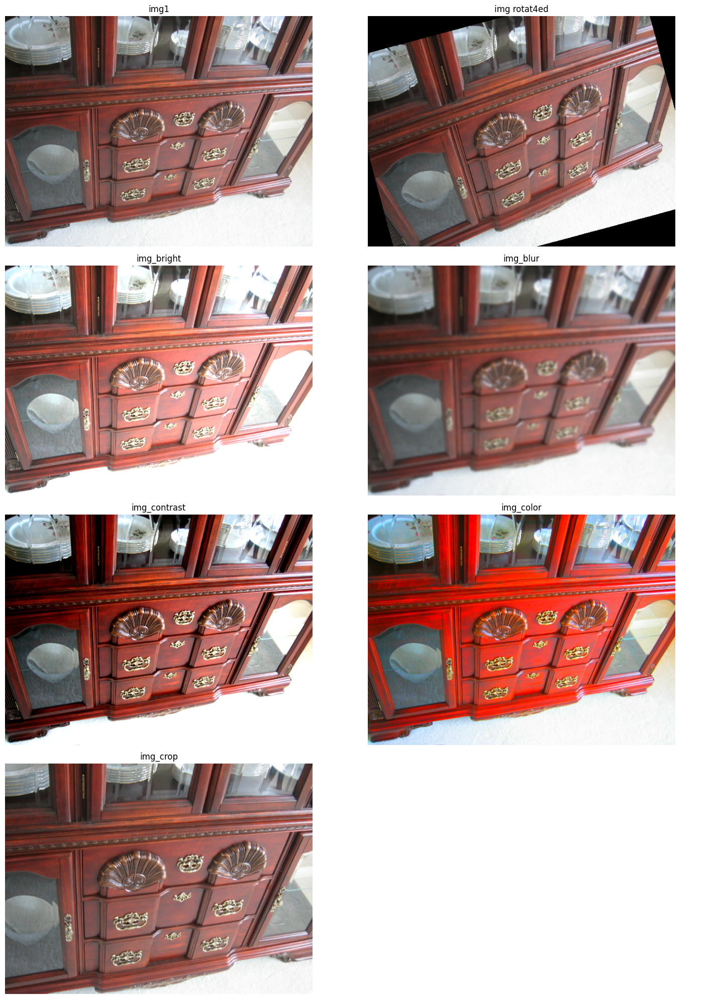

time: 1.59 s (started: 2025-05-20 11:09:49 +00:00)


In [44]:
# visualise different transformations
img_rotated = apply_rotation(img3)
img_bright = apply_brightness(img3)
img_blur = apply_blur(img3)
img_contrast = apply_contrast(img3)
img_color = apply_color(img3)
img_crop = apply_crop_percent(img3)


show_images_in_grid([img3, img_rotated, img_bright, img_blur, img_contrast, img_color, img_crop], 
       titles=["img1", "img rotat4ed", "img_bright", "img_blur", "img_contrast", "img_color", "img_crop"],
        cols=2, figsize=(15, 20))


In [45]:
print("Testing pHash robustness...")
test_robustness_against_transformations(img3, method='phash')

Testing pHash robustness...
phash | Transform: original        | Hash Distance: 0
phash | Transform: rotated         | Hash Distance: 28
phash | Transform: brightened      | Hash Distance: 4
phash | Transform: blurred         | Hash Distance: 0
phash | Transform: high_contrast   | Hash Distance: 0
phash | Transform: cropped         | Hash Distance: 24
phash | Transform: color_adjusted  | Hash Distance: 2
time: 71.7 ms (started: 2025-05-20 11:09:50 +00:00)


In [46]:
print("Testing aHash robustness...")
test_robustness_against_transformations(img3, method='ahash')

Testing aHash robustness...
ahash | Transform: original        | Hash Distance: 0
ahash | Transform: rotated         | Hash Distance: 20
ahash | Transform: brightened      | Hash Distance: 11
ahash | Transform: blurred         | Hash Distance: 0
ahash | Transform: high_contrast   | Hash Distance: 5
ahash | Transform: cropped         | Hash Distance: 15
ahash | Transform: color_adjusted  | Hash Distance: 0
time: 60.9 ms (started: 2025-05-20 11:09:50 +00:00)


## Summary of phash and ahash algo

**pHash is more stable under brightness and contrast changes</br>
Both are sensitive to rotation and cropping.</br>
Both are stable with colour and blur level change</br>
For Contrast, both are acceptable, though aHash shows some drift**


## Histogram for finding Image Similarity

In [47]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def calculate_histogram(image_path, color_space='RGB'):
    # Read the image
    image = cv2.imread(image_path)
    
    if color_space == 'RGB':
        channels = ('b', 'g', 'r')  # OpenCV reads images in BGR format
    elif color_space == 'GRAY':
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        channels = ('gray',)
    else:
        raise ValueError("Unsupported color space. Use 'RGB' or 'GRAY'.")
    
    histograms = []
    
    for i, channel in enumerate(channels):
        hist = cv2.calcHist([image], [i], None, [256], [0, 256])
        cv2.normalize(hist, hist)
        histograms.append(hist)
    
    return histograms

def compare_histograms(image_path1, image_path2, method=cv2.HISTCMP_CORREL):
    
    # Calculate histograms for each image
    hist1 = calculate_histogram(image_path1, color_space='RGB')
    hist2 = calculate_histogram(image_path2, color_space='RGB')
    
    similarity = 0
    for h1, h2 in zip(hist1, hist2):
        similarity += cv2.compareHist(h1, h2, method)
    return similarity / len(hist1), hist1, hist2

def plot_histograms(hist1, hist2):
    colors = ('b', 'g', 'r')
    plt.figure(figsize=(12, 4))

    for i, (h1, h2, color) in enumerate(zip(hist1, hist2, colors)):
        plt.subplot(1, 3, i + 1)
        plt.plot(h1, color=color, label='Image 1')
        plt.plot(h2, color='k', linestyle='--', label='Image 2')  # black dashed for contrast
        plt.title(f'{color.upper()} Channel')
        plt.xlabel('Pixel Intensity')
        plt.ylabel('Normalized Frequency')
        plt.legend()

    plt.tight_layout()
    plt.show()

# Save temp images and compare
def run_histogram_robustness_check(image_path):
    base_image = Image.open(image_path).convert("RGB")
    results = {}

    for name, transform_fn in TRANSFORMATIONS.items():
        transformed_image = transform_fn(base_image)
        temp_path = f"temp_{name}.jpg"
        transformed_image.save(temp_path)

        score, _, _ = compare_histograms(image_path, temp_path)
        results[name] = score

    return results

time: 2.15 ms (started: 2025-05-20 11:09:52 +00:00)


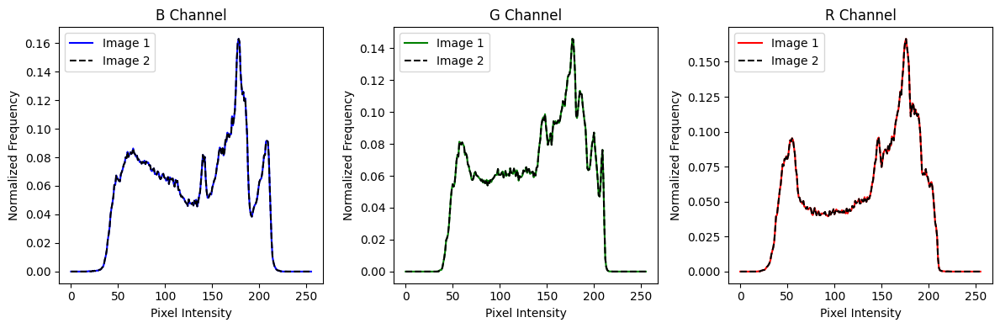

1.0

time: 452 ms (started: 2025-05-20 11:10:00 +00:00)


In [48]:
# hist score for exact duplicate
score, hist1, hist2 = compare_histograms(img1_path, img1_path)
plot_histograms(hist1, hist2)
score

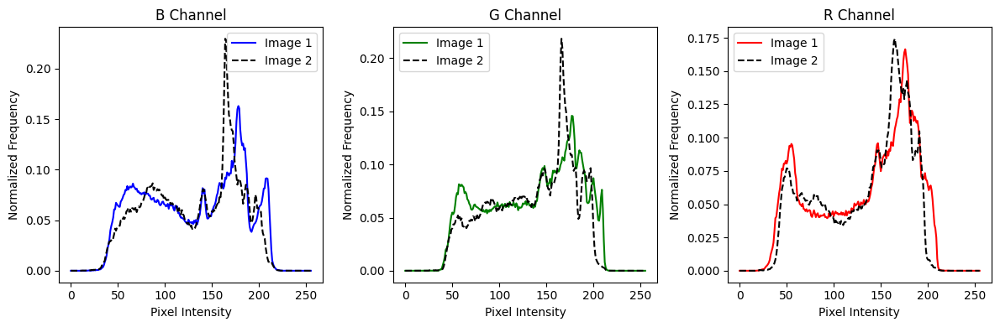

0.8584864463279754

time: 398 ms (started: 2025-05-20 11:10:01 +00:00)


In [49]:
# hist score for near duplicate
score, hist1, hist2 = compare_histograms(img1_path, img2_path)
plot_histograms(hist1, hist2)
score

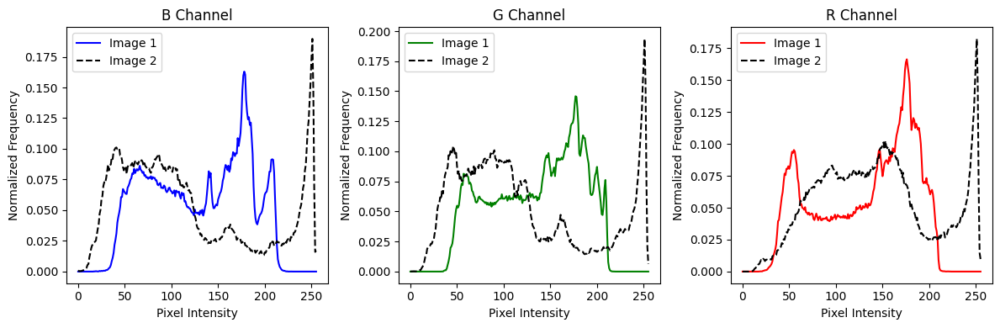

0.08520198823188861

time: 436 ms (started: 2025-05-20 11:10:01 +00:00)


In [50]:
# hist score for not duplicate
score, hist1, hist2 = compare_histograms(img1_path, img3_path)
plot_histograms(hist1, hist2)
score

#### Transformation Robustness Check Using Histogram Similarity

In [51]:
results = run_histogram_robustness_check(img3_path)
for k, v in results.items():
    print(f"Transform: {k.ljust(15)} | Histogram Similarity: {v:.4f}")

Transform: original        | Histogram Similarity: 0.9873
Transform: rotated         | Histogram Similarity: 0.2722
Transform: brightened      | Histogram Similarity: -0.0054
Transform: blurred         | Histogram Similarity: 0.9375
Transform: high_contrast   | Histogram Similarity: -0.0518
Transform: cropped         | Histogram Similarity: 0.8538
Transform: color_adjusted  | Histogram Similarity: 0.4356
time: 107 ms (started: 2025-05-20 11:10:07 +00:00)


## Summary of Histogram result

**Histogram similarity is robust to blurring and moderately robust to cropping.</br>It is not robust to rotation, brightness, or contrast changes. </br>Color adjustments (like RGB channel swaps) degrade performance, but not as severely as brightness/contrast. </br>**


# 2. Semantic Similarity Detection Overview
Semantic similarity detection involves comparing images based on their high-level features, such as objects, scenes, and contexts, rather than low-level pixel information. This approach is robust to variations like lighting, orientation, and background changes

We would be using **ViT-B/16, DINOv2, SigLIP, and Perception Encoder** to generate embeddings. We can then calculate the similarity between embeddings using metrics like cosine similarity.

More details on the models--

**ViT-B/16**: Directly pretrained on ImageNet-21K or JFT-300M, then finetuned, ViT-B/16 delivers strong baseline embeddings for classification and retrieval tasks.Original ViT uses only supervised classification pretraining; semantic features may be less rich compared to self-supervised counterparts

**DINOv2**:Self-supervised loss yields general-purpose features that work “out-of-the-box” across varied tasks (retrieval, segmentation, depth) without finetuning. A Self-supervised loss yields general-purpose features that work “out-of-the-box” across varied tasks (retrieval, segmentation, depth) without finetuning. 

**SigLIP**: Excels at zero-shot classification and image-text retrieval across many languages, thanks to large-scale caption data and efficient sigmoid loss scaling. Performance drops on purely visual tasks (image-only retrieval) if captions are missing or noisy. 

**Perception Encoder**:  PE is a family of CLIP-style encoders trained via simple contrastive vision-language learning on both image and synthetic video data. It discovers generalized embeddings in intermediate layers and aligns them for distinct tasks. Looks very promising for zero shot image classification and retrieval tasks.


**Recommendations:**</br>
**Pure Image-Only Similarity (no text)**: DINOv2 or Perception Encoder—self-supervised, rich semantic features, robust across domains.</br>
**Cross-Modal / Zero-Shot Tasks:** SigLIP, PE —direct image-text alignment and multilingual support.</br>
**Lightweight Baseline:** ViT-B/16—good transfer to mid-scale tasks, widely available, but needs finetuning for deep semantics.</br>

In [52]:
#imports
import torch
from transformers import AutoImageProcessor, AutoModel
from PIL import Image
import requests
from torchvision import transforms
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np

time: 643 µs (started: 2025-05-20 11:10:11 +00:00)


In [53]:
# Function to load and preprocess an image
def load_image(image_path):
    image = Image.open(image_path).convert('RGB')
    return image

time: 452 µs (started: 2025-05-20 11:10:11 +00:00)


### We will also run the model on the entire ukbench100 dataset to identify all similar image pairs. For this, we will use Facebook's FAISS as an in-memory vector database to store each face embedding.

In [54]:
#install faiss
!pip install faiss-cpu -q

time: 3.03 s (started: 2025-05-20 11:10:12 +00:00)


In [55]:
#helper function for to build and looking up nearest embedding vectors using faiss
import faiss
import numpy as np
import matplotlib.pyplot as plt

def build_faiss_index(embeddings, use_cosine=True):
    if use_cosine:
        # Normalize for cosine similarity
        embeddings = embeddings / np.linalg.norm(embeddings, axis=1, keepdims=True)
        index = faiss.IndexFlatIP(embeddings.shape[1])  # Inner Product == Cosine if normalized
    else:
        index = faiss.IndexFlatL2(embeddings.shape[1])
    
    index.add(embeddings.astype(np.float32))
    return index

def find_similar_groups_faiss(index, embeddings, filenames, threshold=0.9, top_k=5):
    groups = []
    visited = set()
    
    D, I = index.search(embeddings, top_k)  # Distances and indices

    for i, neighbors in enumerate(I):
        if i in visited:
            continue
        group = [i]
        for j, sim_score in zip(neighbors[1:], D[i][1:]):  # Skip self-match
            if sim_score >= threshold and j not in visited:
                group.append(j)
        if len(group) > 1:
            groups.append(group)
            visited.update(group)

    ungrouped = [i for i in range(len(filenames)) if i not in visited]
    return groups, ungrouped



def plot_image_groups(images, filenames, groups, max_display=5):
    for idx, group in enumerate(groups):
        plt.figure(figsize=(4 * min(len(group), max_display), 4))
        for i, img_idx in enumerate(group[:max_display]):
            plt.subplot(1, min(len(group), max_display), i + 1)
            plt.imshow(images[img_idx])
            plt.title(filenames[img_idx])
            plt.axis('off')
        plt.suptitle(f"Group {idx + 1} - {len(group)} similar images")
        plt.show()

time: 2.81 ms (started: 2025-05-20 11:10:15 +00:00)


In [56]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

time: 15.7 ms (started: 2025-05-20 11:10:15 +00:00)


## ViT-B/16
Getting feature embedding using ViT-B/16 

In [57]:
from transformers import ViTModel, ViTImageProcessor
import torch
from PIL import Image


def get_vit_embedding(image):
    inputs = processor(images=image, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = model(**inputs)
        # Extract the [CLS] token embedding
        embedding = outputs.last_hidden_state[:, 0, :].to('cpu')
        # Normalize the embedding
        embedding = torch.nn.functional.normalize(embedding, p=2, dim=1)
    return embedding


def get_vit_similarity(image1,image2):
    # Load and process images

    embedding1 = get_vit_embedding(image1)
    embedding2 = get_vit_embedding(image2)
    
    # Compute cosine similarity
    similarity = cosine_similarity(embedding1, embedding2)
    # print(f"Semantic Similarity (DINOv2): {similarity[0][0]:.4f}")
    return similarity[0][0]


# Load the pre-trained model and processor
model_name = "google/vit-base-patch16-224-in21k"
model = ViTModel.from_pretrained(model_name)
processor = ViTImageProcessor.from_pretrained(model_name)
model.to(device)
model.eval()



ViTModel(
  (embeddings): ViTEmbeddings(
    (patch_embeddings): ViTPatchEmbeddings(
      (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
    )
    (dropout): Dropout(p=0.0, inplace=False)
  )
  (encoder): ViTEncoder(
    (layer): ModuleList(
      (0-11): 12 x ViTLayer(
        (attention): ViTAttention(
          (attention): ViTSelfAttention(
            (query): Linear(in_features=768, out_features=768, bias=True)
            (key): Linear(in_features=768, out_features=768, bias=True)
            (value): Linear(in_features=768, out_features=768, bias=True)
          )
          (output): ViTSelfOutput(
            (dense): Linear(in_features=768, out_features=768, bias=True)
            (dropout): Dropout(p=0.0, inplace=False)
          )
        )
        (intermediate): ViTIntermediate(
          (dense): Linear(in_features=768, out_features=3072, bias=True)
          (intermediate_act_fn): GELUActivation()
        )
        (output): ViTOutput(
          (d

time: 701 ms (started: 2025-05-20 11:10:15 +00:00)


In [58]:
# similarity score almost similar img
get_vit_similarity(img1,img2)

np.float32(0.83706355)

time: 130 ms (started: 2025-05-20 11:10:15 +00:00)


In [59]:
# similarity score not similar img
get_vit_similarity(img1,img3)

np.float32(-0.013316145)

time: 37.5 ms (started: 2025-05-20 11:10:16 +00:00)


In [60]:
get_vit_embedding(img1).squeeze().shape

torch.Size([768])

time: 20 ms (started: 2025-05-20 11:10:16 +00:00)


In [61]:
def test_robustness_against_transformations(base_image):
    """Compare original image with transformed versions and print distances."""
    results = {}
    for name, transform in TRANSFORMATIONS.items():
        transformed_img = transform(base_image)
        distance = get_vit_similarity(base_image, transformed_img)
        results[name] = distance
        print(f"ViT | Transform: {name:<15} | Hash Distance: {distance}")
    return 


test_robustness_against_transformations(img1)
#response time on GPU: 256ms,compared to cpu- 2.69

ViT | Transform: original        | Hash Distance: 1.0000001192092896
ViT | Transform: rotated         | Hash Distance: 0.8041715025901794
ViT | Transform: brightened      | Hash Distance: 0.8194941282272339
ViT | Transform: blurred         | Hash Distance: 0.9392582178115845
ViT | Transform: high_contrast   | Hash Distance: 0.9148306846618652
ViT | Transform: cropped         | Hash Distance: 0.5536074638366699
ViT | Transform: color_adjusted  | Hash Distance: 0.8730080723762512
time: 275 ms (started: 2025-05-20 11:10:19 +00:00)


### Identifying all similar image from ukbench100 dataset

embed_np shape : (100, 768); total file count : 100


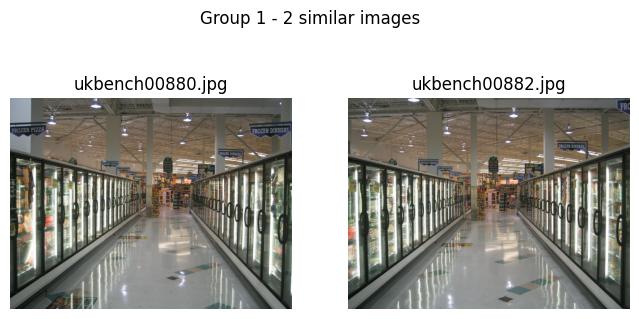

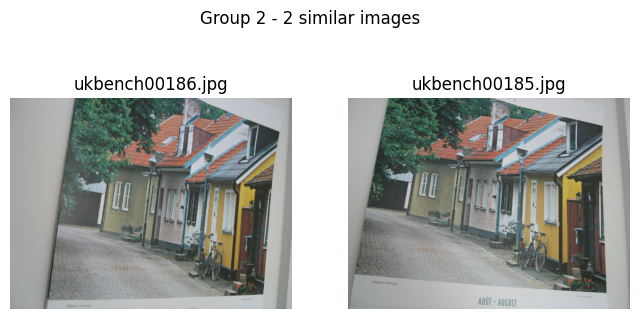

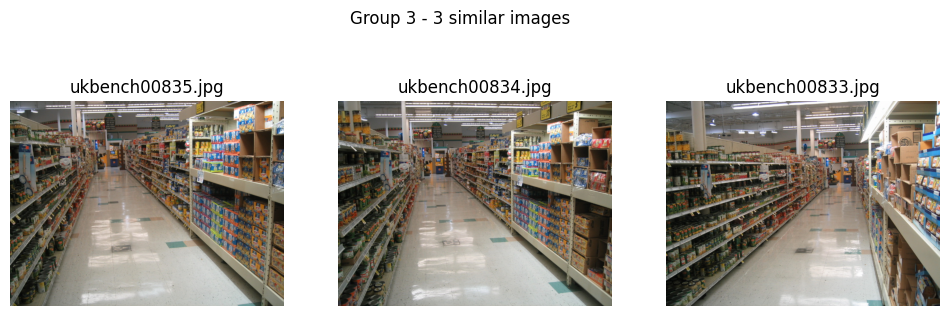

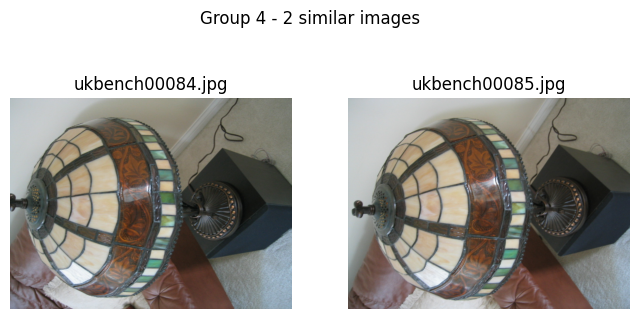

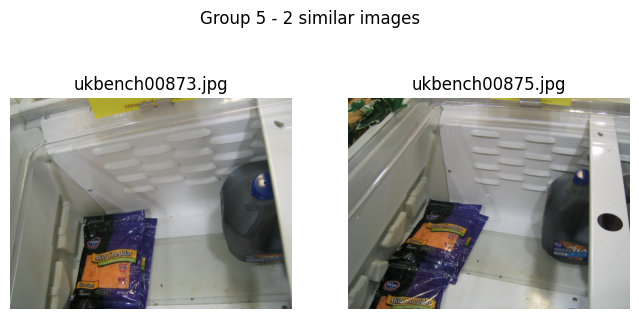

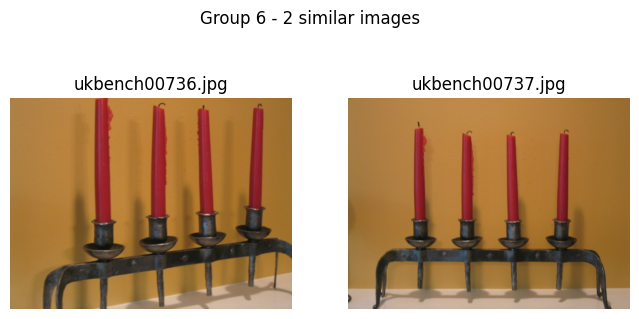

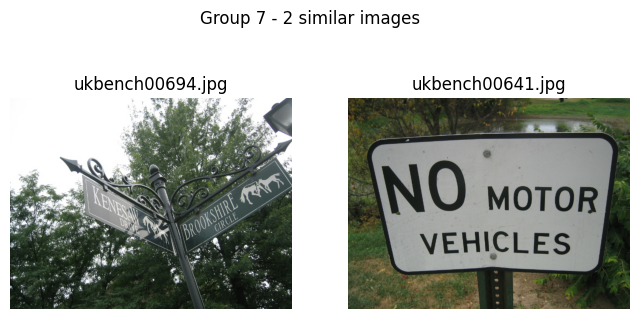

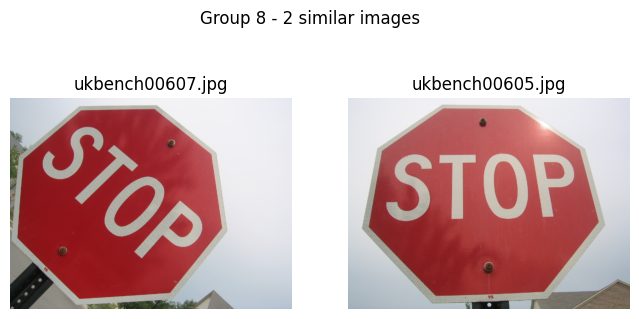

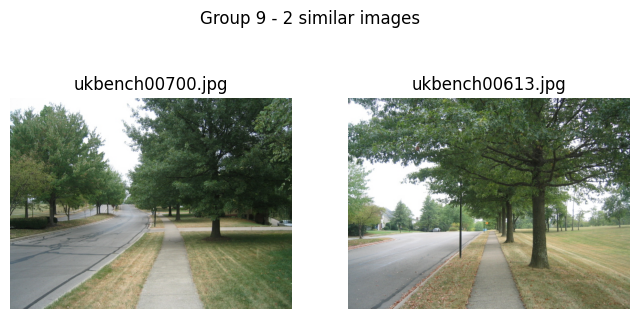

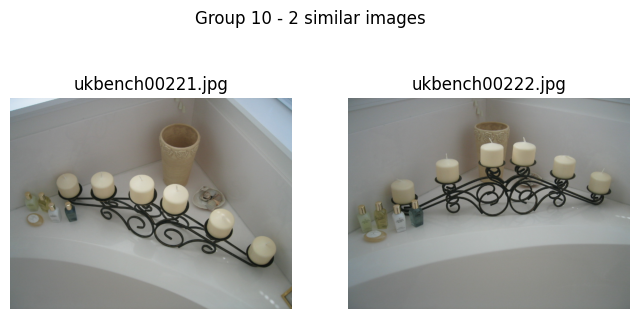

time: 4.5 s (started: 2025-05-20 11:10:22 +00:00)


In [62]:
#index image embedding 
import os
images = []
embed_list = []
img_filenames = []
base_path = '/kaggle/input/ukbench100'
for filename in os.listdir(base_path):
    if not filename.endswith('.jpg'):
        continue
    image = load_image(os.path.join(base_path, filename))
    images.append(image)
    embed_list.append(get_vit_embedding(image)[0])
    img_filenames.append(filename)
    
embed_np = np.stack(embed_list)
print(f"embed_np shape : {embed_np.shape}; total file count : {len(img_filenames)}")
index = build_faiss_index(embed_np, use_cosine=True)
groups, ungroups = find_similar_groups_faiss(index, embed_np, img_filenames, threshold=0.6)

plot_image_groups(images, img_filenames, groups)

## DINOv2

In [63]:
# Load the pre-trained DINOv2 model and processor
processor = AutoImageProcessor.from_pretrained('facebook/dinov2-base')
model = AutoModel.from_pretrained('facebook/dinov2-base')
model.to(device)
model.eval()


# Function to extract embeddings
def get_dino_embedding(image):
    inputs = processor(images=image, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = model(**inputs)
    # Use the [CLS] token embedding
    embedding = outputs.last_hidden_state[:, 0, :].to('cpu')
    embedding = torch.nn.functional.normalize(embedding, p=2, dim=1)  # L2 norm
    return embedding

def get_dino_similarity(image1,image2):
    embedding1 = get_dino_embedding(image1)
    embedding2 = get_dino_embedding(image2)
    
    # Compute cosine similarity
    similarity = cosine_similarity(embedding1, embedding2)
    # print(f"Semantic Similarity (DINOv2): {similarity[0][0]:.4f}")
    return similarity[0][0]

def test_robustness_against_transformations(base_image):
    """Compare original image with transformed versions and print distances."""
    results = {}
    for name, transform in TRANSFORMATIONS.items():
        transformed_img = transform(base_image)
        distance = get_dino_similarity(base_image, transformed_img)
        results[name] = distance
        print(f"DINOv2 | Transform: {name:<15} | Hash Distance: {distance}")
    return 

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


time: 521 ms (started: 2025-05-20 11:10:27 +00:00)


In [64]:
# similarity score almost similar img
get_dino_similarity(img1,img2)

np.float32(0.9357532)

time: 52.5 ms (started: 2025-05-20 11:10:30 +00:00)


In [65]:
# similarity score not similar ig
get_dino_similarity(img1,img4)

np.float32(-0.05031032)

time: 50.4 ms (started: 2025-05-20 11:10:30 +00:00)


In [66]:
test_robustness_against_transformations(img1)

DINOv2 | Transform: original        | Hash Distance: 1.0000001192092896
DINOv2 | Transform: rotated         | Hash Distance: 0.916545569896698
DINOv2 | Transform: brightened      | Hash Distance: 0.9875563383102417
DINOv2 | Transform: blurred         | Hash Distance: 0.9501748085021973
DINOv2 | Transform: high_contrast   | Hash Distance: 0.9984591007232666
DINOv2 | Transform: cropped         | Hash Distance: 0.9419456124305725
DINOv2 | Transform: color_adjusted  | Hash Distance: 0.9770358204841614
time: 364 ms (started: 2025-05-20 11:10:30 +00:00)


embed_np shape : (100, 768); total file count : 100


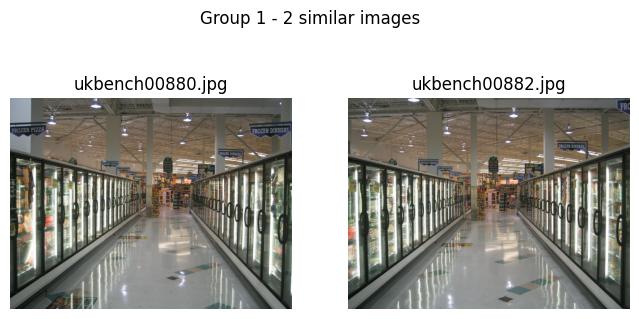

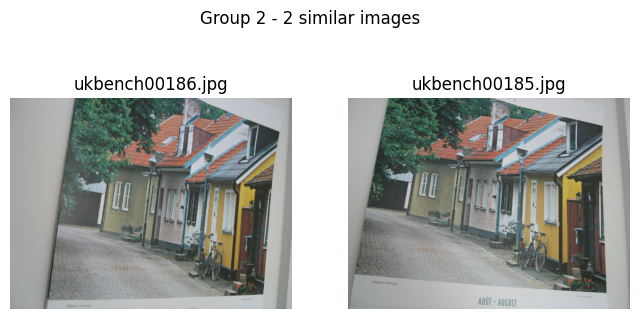

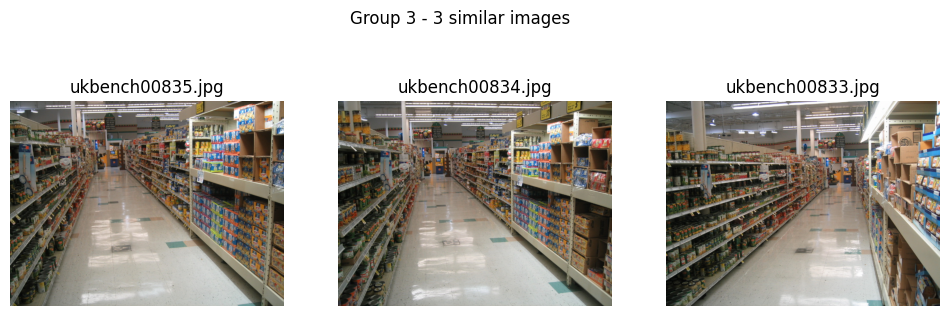

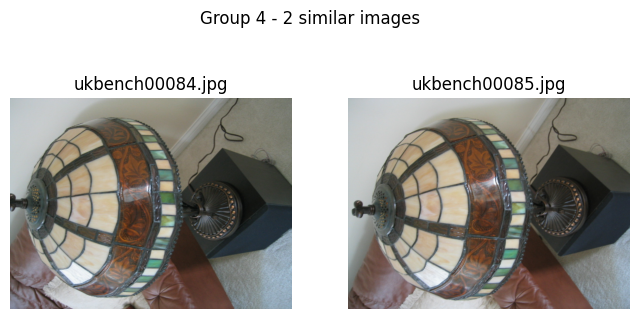

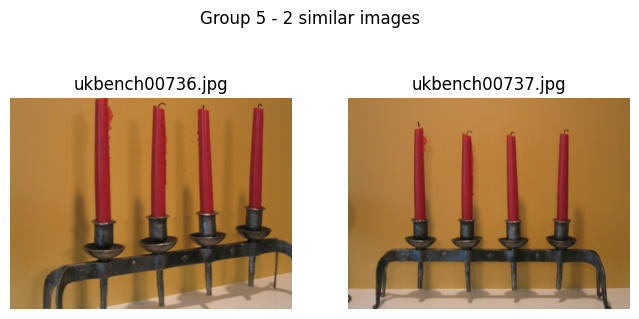

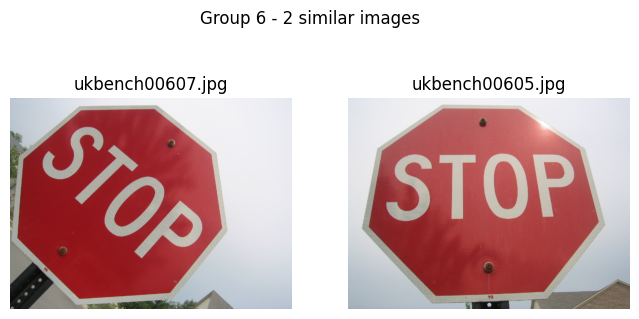

time: 3.94 s (started: 2025-05-20 11:10:31 +00:00)


In [67]:
#index image embedding 
import os
images = []
embed_list = []
img_filenames = []
base_path = '/kaggle/input/ukbench100'
for filename in os.listdir(base_path):
    if not filename.endswith('.jpg'):
        continue
    image = load_image(os.path.join(base_path, filename))
    images.append(image)
    embed_list.append(get_dino_embedding(image)[0])
    img_filenames.append(filename)
    
embed_np = np.stack(embed_list)
print(f"embed_np shape : {embed_np.shape}; total file count : {len(img_filenames)}")
index = build_faiss_index(embed_np, use_cosine=True)
groups, ungroups = find_similar_groups_faiss(index, embed_np, img_filenames, threshold=0.90, top_k=8)

plot_image_groups(images, img_filenames, groups)

## siglip

In [68]:
from transformers import AutoProcessor, AutoModel
import torch

# Load the SigLIP model and processor
processor = AutoProcessor.from_pretrained("google/siglip-base-patch16-224")
model = AutoModel.from_pretrained("google/siglip-base-patch16-224")
model.to(device)
model.eval()

# Function to extract embeddings
def get_siglip_embedding(image):
    inputs = processor(images=image, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}
    with torch.no_grad():
        outputs = model.get_image_features(**inputs)
    embedding = outputs.cpu() #.numpy()  # Move output to CPU before converting to NumPy
    embedding = torch.nn.functional.normalize(embedding, p=2, dim=1)
    return embedding

def get_siglip_similarity(image1,image2):
    embedding1 = get_siglip_embedding(image1)
    embedding2 = get_siglip_embedding(image2)
    
    # Compute cosine similarity
    similarity = cosine_similarity(embedding1, embedding2)
    # print(f"Semantic Similarity : {similarity[0][0]:.4f}")
    return similarity[0][0]

def test_robustness_against_transformations(base_image):
    """Compare original image with transformed versions and print distances."""
    results = {}
    for name, transform in TRANSFORMATIONS.items():
        transformed_img = transform(base_image)
        distance = get_siglip_similarity(base_image, transformed_img)
        results[name] = distance
        print(f"Siglip | Transform: {name:<15} | Hash Distance: {distance}")
    return 

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


time: 2.19 s (started: 2025-05-20 11:10:35 +00:00)


In [69]:
# similarity score  duplicate img
get_siglip_similarity(img1,img1)

np.float32(1.0000002)

time: 95.5 ms (started: 2025-05-20 11:10:37 +00:00)


In [70]:
# similarity score almost similar img
get_siglip_similarity(img1,img2)

np.float32(0.92141914)

time: 38.9 ms (started: 2025-05-20 11:10:37 +00:00)


In [71]:
# similarity score not similar ig
get_siglip_similarity(img1,img4)

np.float32(0.5273686)

time: 38.7 ms (started: 2025-05-20 11:10:37 +00:00)


In [72]:
test_robustness_against_transformations(img1)

# respones time = 287 ms on P100 compared to cpu of 3.9 secs

Siglip | Transform: original        | Hash Distance: 1.000000238418579
Siglip | Transform: rotated         | Hash Distance: 0.8560802340507507
Siglip | Transform: brightened      | Hash Distance: 0.9474383592605591
Siglip | Transform: blurred         | Hash Distance: 0.9136821627616882
Siglip | Transform: high_contrast   | Hash Distance: 0.9802303314208984
Siglip | Transform: cropped         | Hash Distance: 0.8806498050689697
Siglip | Transform: color_adjusted  | Hash Distance: 0.9581054449081421
time: 288 ms (started: 2025-05-20 11:10:37 +00:00)


embed_np shape : (100, 768); total file count : 100


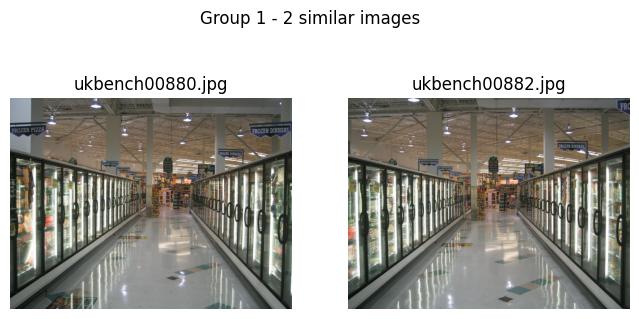

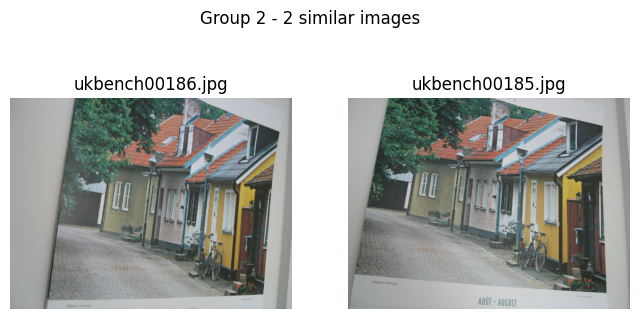

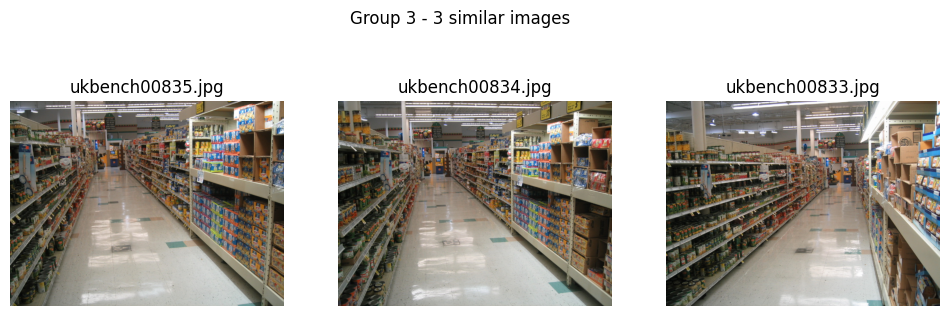

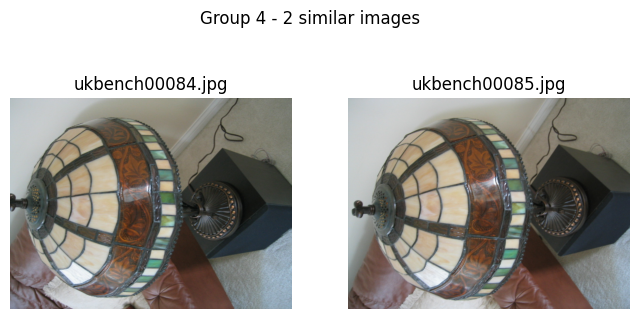

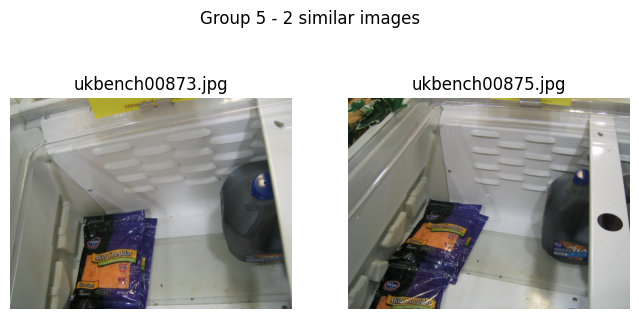

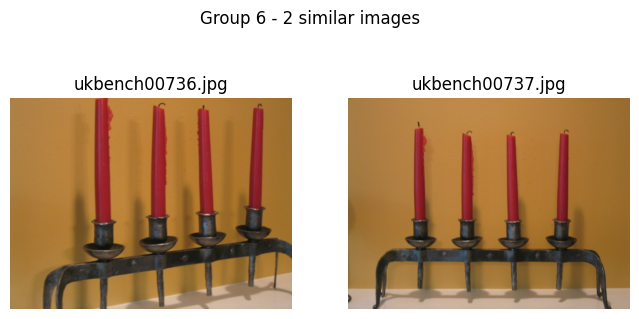

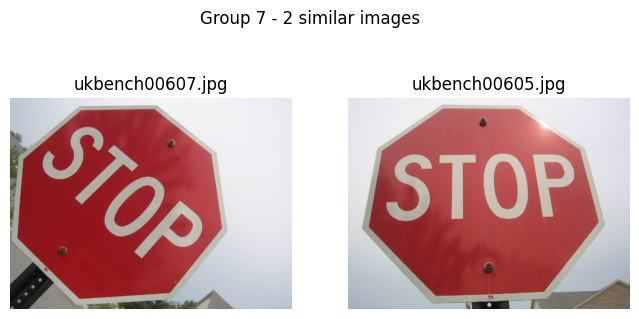

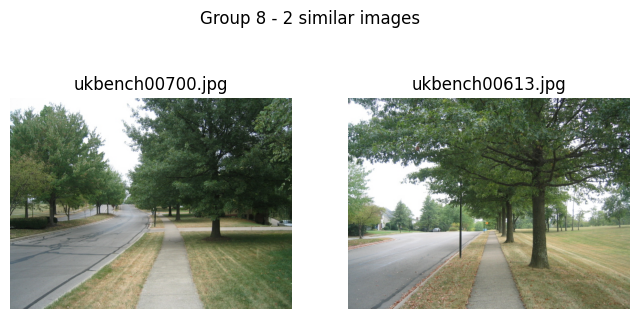

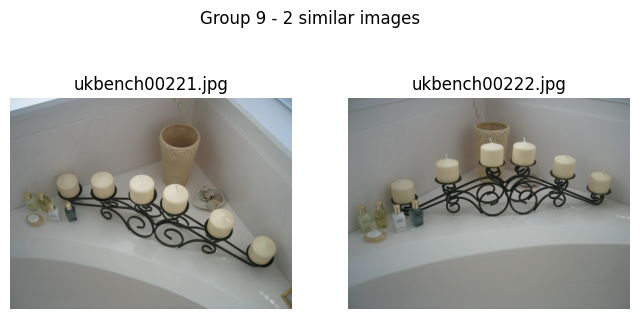

time: 3.87 s (started: 2025-05-20 11:10:41 +00:00)


In [73]:
#index image embedding 
import os
images = []
embed_list = []
img_filenames = []
base_path = '/kaggle/input/ukbench100'
for filename in os.listdir(base_path):
    if not filename.endswith('.jpg'):
        continue
    image = load_image(os.path.join(base_path, filename))
    images.append(image)
    embed_list.append(get_siglip_embedding(image)[0])
    img_filenames.append(filename)
    
embed_np = np.stack(embed_list)
print(f"embed_np shape : {embed_np.shape}; total file count : {len(img_filenames)}")
index = build_faiss_index(embed_np, use_cosine=True)
groups, ungroups = find_similar_groups_faiss(index, embed_np, img_filenames, threshold=0.88, top_k=8)

plot_image_groups(images, img_filenames, groups)

## Perception Encoder
Seems promising for similar image retrieval or zero shot classification use cases.

In [20]:
!git clone https://github.com/facebookresearch/perception_models.git

fatal: destination path 'perception_models' already exists and is not an empty directory.
time: 140 ms (started: 2025-05-20 11:08:19 +00:00)


In [21]:
ls

perception_models/   temp_color_adjusted.jpg  temp_original.jpg
temp_blurred.jpg     temp_cropped.jpg         temp_rotated.jpg
temp_brightened.jpg  temp_high_contrast.jpg
time: 140 ms (started: 2025-05-20 11:08:27 +00:00)


In [ ]:
!pip install ffmpeg
!pip install torchcodec==0.1 --index-url=https://download.pytorch.org/whl/cu124
!pip install torch==2.5.1 torchvision==0.20.1 torchaudio==2.5.1 xformers --index-url https://download.pytorch.org/whl/cu124
!pip install -e ./perception_models/

### restart session to be able to import below packages post installation

In [22]:
import torch
from PIL import Image
import core.vision_encoder.pe as pe
import core.vision_encoder.transforms as transforms

time: 1.4 s (started: 2025-05-20 11:08:33 +00:00)


In [23]:
print("CLIP configs:", pe.CLIP.available_configs())
# CLIP configs: ['PE-Core-G14-448', 'PE-Core-L14-336', 'PE-Core-B16-224']

model = pe.CLIP.from_config("PE-Core-B16-224", pretrained=True)  # Downloads from HF
model = model.cuda()


CLIP configs: ['PE-Core-G14-448', 'PE-Core-L14-336', 'PE-Core-B16-224']
Missing keys for loading model: []
Unexpected keys for loading model: []
time: 6.51 s (started: 2025-05-20 11:08:35 +00:00)


In [24]:
model

CLIP(
  (token_embedding): Embedding(49408, 1024)
  (transformer): Transformer(
    (resblocks): ModuleList(
      (0-23): 24 x ResidualAttentionBlock(
        (attn): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=1024, out_features=1024, bias=True)
        )
        (ls_1): Identity()
        (ls_2): Identity()
        (ln_1): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
        (ln_2): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
        (drop_path1): Identity()
        (drop_path2): Identity()
        (mlp): Sequential(
          (c_fc): Linear(in_features=1024, out_features=4096, bias=True)
          (gelu): GELU(approximate='none')
          (c_proj): Linear(in_features=4096, out_features=1024, bias=True)
        )
      )
    )
  )
  (ln_final): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16), bias=False)
    (ln_pre):

time: 3.91 ms (started: 2025-05-20 11:08:42 +00:00)


In [25]:
preprocess = transforms.get_image_transform(model.image_size)
tokenizer = transforms.get_text_tokenizer(model.context_length)

time: 122 ms (started: 2025-05-20 11:08:42 +00:00)


In [32]:
import torch
import numpy as np
from PIL import Image
from sklearn.metrics.pairwise import cosine_similarity

def get_perception_embedding(image):
    """
    Extracts and normalizes image embedding from PerceptionEncoder/CLIP-like model.
    
    Args:
        image (PIL.Image): Input image.
        model: The PerceptionEncoder model (must return image_features).
        preprocess: The preprocessing function (e.g., CLIP-style transforms).
        
    Returns:
        np.ndarray: L2-normalized image embedding as (D,) vector.
    """
    image_tensor = preprocess(image).unsqueeze(0).cuda()
    
    with torch.no_grad(), torch.autocast("cuda"):
        image_features, _, _ = model(image_tensor, None)  # Skip text

    # Normalize (important for cosine similarity)
    image_features = torch.nn.functional.normalize(image_features, p=2, dim=1)

    return image_features.cpu().numpy()

def get_pe_similarity(image1,image2):
    embedding1 = get_perception_embedding(image1)
    embedding2 = get_perception_embedding(image2)
    
    # Compute cosine similarity
    similarity = cosine_similarity(embedding1, embedding2)
    # print(f"Semantic Similarity : {similarity[0][0]:.4f}")
    return similarity[0][0]

def test_robustness_against_transformations(base_image):
    """Compare original image with transformed versions and print distances."""
    results = {}
    for name, transform in TRANSFORMATIONS.items():
        transformed_img = transform(base_image)
        distance = get_pe_similarity(base_image, transformed_img)
        results[name] = distance
        print(f"Perception Encoder Core | Transform: {name:<15} | Hash Distance: {distance}")
    return 

time: 1.32 ms (started: 2025-05-20 11:09:02 +00:00)


In [33]:
# similarity score  duplicate img
get_pe_similarity(img1,img1)

np.float32(0.9999999)

time: 44.4 ms (started: 2025-05-20 11:09:02 +00:00)


In [34]:
# similarity score similar img
get_pe_similarity(img1,img2)

np.float32(0.9316576)

time: 43.4 ms (started: 2025-05-20 11:09:03 +00:00)


In [35]:
# similarity score  not similar img
get_pe_similarity(img1,img3)

np.float32(0.27186865)

time: 44.4 ms (started: 2025-05-20 11:09:03 +00:00)


In [36]:
test_robustness_against_transformations(img1)
# 306 ms 

Perception Encoder Core | Transform: original        | Hash Distance: 0.9999998807907104
Perception Encoder Core | Transform: rotated         | Hash Distance: 0.9361283779144287
Perception Encoder Core | Transform: brightened      | Hash Distance: 0.9714565277099609
Perception Encoder Core | Transform: blurred         | Hash Distance: 0.9385623931884766
Perception Encoder Core | Transform: high_contrast   | Hash Distance: 0.9913562536239624
Perception Encoder Core | Transform: cropped         | Hash Distance: 0.9190697073936462
Perception Encoder Core | Transform: color_adjusted  | Hash Distance: 0.975999116897583
time: 315 ms (started: 2025-05-20 11:09:03 +00:00)


embed_np shape : (100, 1024); total file count : 100


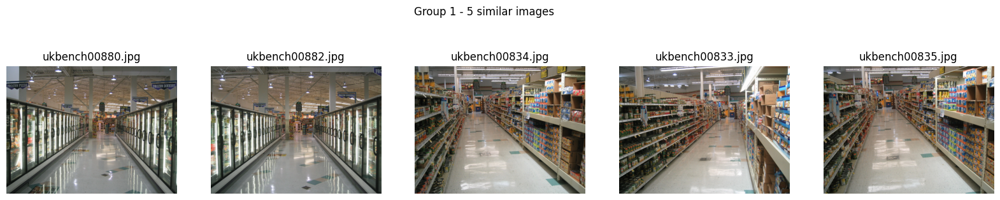

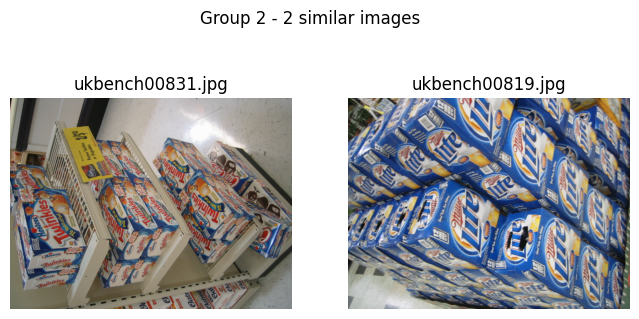

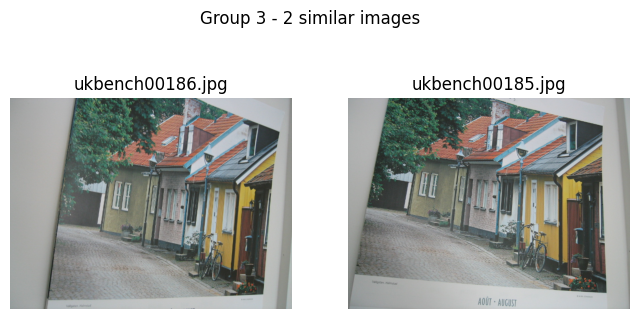

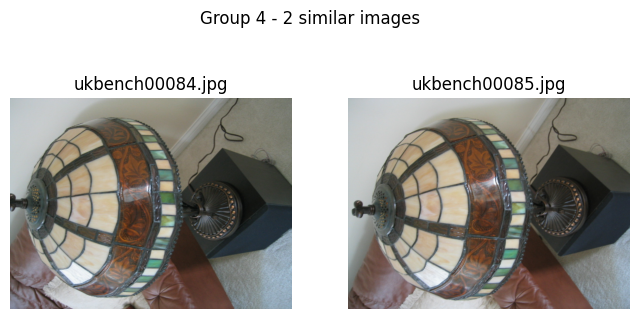

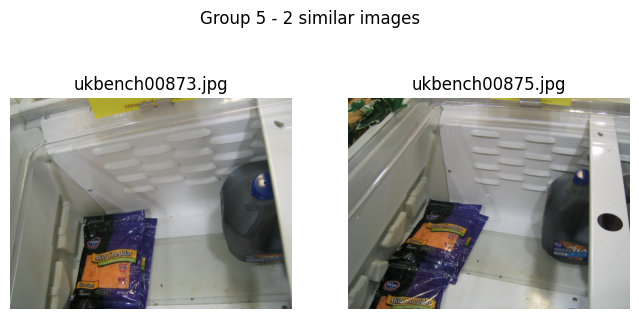

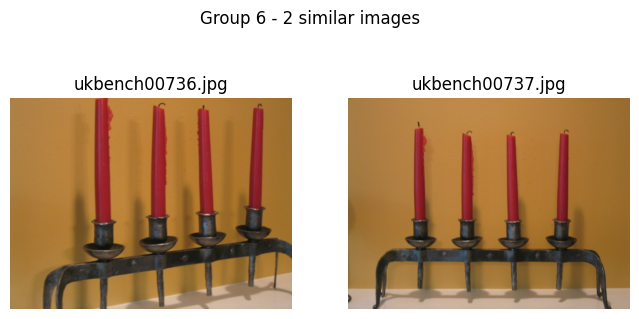

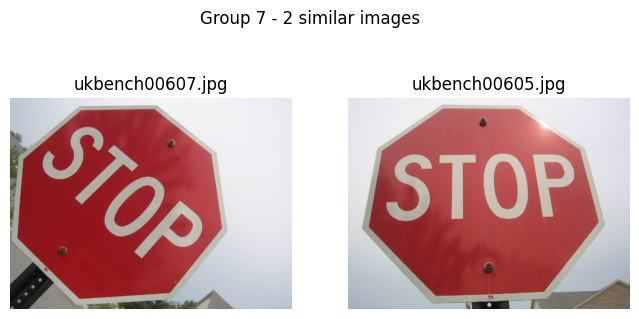

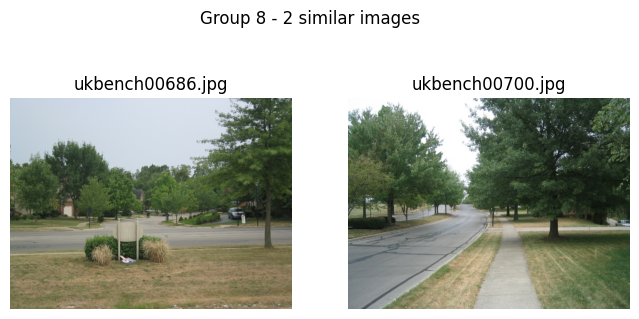

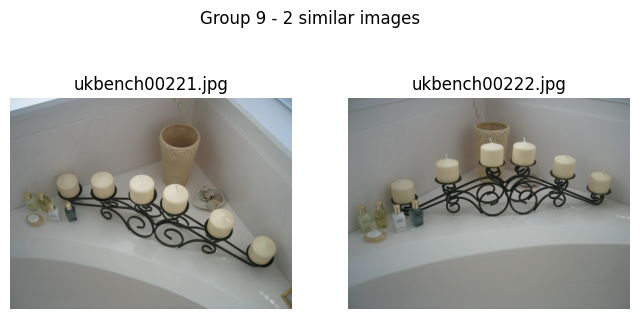

time: 4.13 s (started: 2025-05-20 11:09:03 +00:00)


In [37]:
#index image embedding 
import os
images = []
embed_list = []
img_filenames = []
base_path = '/kaggle/input/ukbench100'
for filename in os.listdir(base_path):
    if not filename.endswith('.jpg'):
        continue
    image = load_image(os.path.join(base_path, filename))
    images.append(image)
    embed_list.append(get_perception_embedding(image)[0])          #change get embedding fn here
    img_filenames.append(filename)
    
embed_np = np.stack(embed_list)
print(f"embed_np shape : {embed_np.shape}; total file count : {len(img_filenames)}")
index = build_faiss_index(embed_np, use_cosine=True)
groups, ungroups = find_similar_groups_faiss(index, embed_np, img_filenames, threshold=0.8, top_k=8)

plot_image_groups(images, img_filenames, groups)

## Conclusion

**ViT, DINOv2, SigLIP or Perception Encoder all offer powerful options for semantic image similarity search. Each model captures different aspects of visual semantics, so the best choice often depends on the specific characteristics of your domain and use case. While I haven't conducted exhaustive benchmarking due to dataset limitations, initial results suggest that all three can be effective with appropriate tuning.**

For any chosen model, the similarity threshold plays a key role:
- A higher threshold tends to detect near-duplicates or visually identical images.
- A lower threshold allows grouping of semantically similar images that may vary in color, style, or minor details.

**Tuning this threshold based on your target use case can help balance precision and generalization in clustering similar images**



### Do comment if you're aware of any datasets, tools, or techniques that can help benchmark models for general image similarity or retrieval tasks.

### If you’ve worked on similar problems or know of better solution for semantic image similarity, I’d love to hear from you in the comments!